# Multivariate data analysis of the Spotify Tracks dataset

## Imports and installs

In [1]:
%pip install datasets


  Using cached filelock-3.16.1-py3-none-any.whl.metadata (2.9 kB)
   ---------------------------------------- 0.0/25.1 MB ? eta -:--:--
   ------- -------------------------------- 4.5/25.1 MB 26.7 MB/s eta 0:00:01
   ------------- -------------------------- 8.7/25.1 MB 23.3 MB/s eta 0:00:01
   ------------------- -------------------- 12.1/25.1 MB 21.0 MB/s eta 0:00:01
   ------------------------- -------------- 16.0/25.1 MB 20.5 MB/s eta 0:00:01
   ------------------------------ --------- 18.9/25.1 MB 18.6 MB/s eta 0:00:01
   ----------------------------------- ---- 22.3/25.1 MB 18.1 MB/s eta 0:00:01
   ---------------------------------------  24.9/25.1 MB 18.1 MB/s eta 0:00:01
   ---------------------------------------- 25.1/25.1 MB 17.3 MB/s eta 0:00:00
Using cached filelock-3.16.1-py3-none-any.whl (16 kB)
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [1]:
# imports
try:
    # Data manipulation libraries
    import pandas as pd
    import numpy as np

    # Visualization libraries
    import matplotlib.pyplot as plt
    import seaborn as sns
    import altair as alt

    # Machine learning
    from sklearn import datasets
    from sklearn.preprocessing import LabelEncoder
    from sklearn.preprocessing import StandardScaler
    from sklearn.decomposition import TruncatedSVD
    from sklearn.decomposition import PCA
    from sklearn.manifold import TSNE
    import umap

    print("All required libraries are already installed!")
except ImportError as e:
    print(f"Missing library: {e}")

from datasets import load_dataset


c:\Users\augus\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


All required libraries are already installed!


In [48]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD
from scipy.stats import skew


## Load the dataset + early analysis

### Load the dataset

In [3]:
dataset = load_dataset("maharshipandya/spotify-tracks-dataset")

### Early exploratory analysis

In [4]:
print(dataset)
# Nr of observations is 114000

DatasetDict({
    train: Dataset({
        features: ['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name', 'popularity', 'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature', 'track_genre'],
        num_rows: 114000
    })
})


In [5]:
df = pd.DataFrame(dataset['train'])

In [7]:
print(df.head(20))

    Unnamed: 0                track_id                               artists  \
0            0  5SuOikwiRyPMVoIQDJUgSV                           Gen Hoshino   
1            1  4qPNDBW1i3p13qLCt0Ki3A                          Ben Woodward   
2            2  1iJBSr7s7jYXzM8EGcbK5b                Ingrid Michaelson;ZAYN   
3            3  6lfxq3CG4xtTiEg7opyCyx                          Kina Grannis   
4            4  5vjLSffimiIP26QG5WcN2K                      Chord Overstreet   
5            5  01MVOl9KtVTNfFiBU9I7dc                          Tyrone Wells   
6            6  6Vc5wAMmXdKIAM7WUoEb7N  A Great Big World;Christina Aguilera   
7            7  1EzrEOXmMH3G43AXT1y7pA                            Jason Mraz   
8            8  0IktbUcnAGrvD03AWnz3Q8             Jason Mraz;Colbie Caillat   
9            9  7k9GuJYLp2AzqokyEdwEw2                        Ross Copperman   
10          10  4mzP5mHkRvGxdhdGdAH7EJ                          Zack Tabudlo   
11          11  5ivF4eQBqJiVL5IAE9jRyl  

In [12]:
df.shape

(114000, 21)

In [8]:
print(df.columns)

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')


In [9]:
print(df.describe())

          Unnamed: 0     popularity   duration_ms   danceability  \
count  114000.000000  114000.000000  1.140000e+05  114000.000000   
mean    56999.500000      33.238535  2.280292e+05       0.566800   
std     32909.109681      22.305078  1.072977e+05       0.173542   
min         0.000000       0.000000  0.000000e+00       0.000000   
25%     28499.750000      17.000000  1.740660e+05       0.456000   
50%     56999.500000      35.000000  2.129060e+05       0.580000   
75%     85499.250000      50.000000  2.615060e+05       0.695000   
max    113999.000000     100.000000  5.237295e+06       0.985000   

              energy            key       loudness           mode  \
count  114000.000000  114000.000000  114000.000000  114000.000000   
mean        0.641383       5.309140      -8.258960       0.637553   
std         0.251529       3.559987       5.029337       0.480709   
min         0.000000       0.000000     -49.531000       0.000000   
25%         0.472000       2.000000     -1

In [10]:
print(df.isnull().sum())

Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64


In [ ]:
#save the data to a csv file
# df.to_csv('spotify_tracks.csv', index=False)

In [11]:
print("\nData types of each column:")
for col in df.columns:
    print(f'{col}: {df[col].dtype}')


Data types of each column:
Unnamed: 0: int64
track_id: object
artists: object
album_name: object
track_name: object
popularity: int64
duration_ms: int64
explicit: bool
danceability: float64
energy: float64
key: int64
loudness: float64
mode: int64
speechiness: float64
acousticness: float64
instrumentalness: float64
liveness: float64
valence: float64
tempo: float64
time_signature: int64
track_genre: object


### Removal of data

#### Removal of irrelavant column

In [17]:
df.drop(columns=['Unnamed: 0'], axis=1, inplace=True)

In [18]:
df.shape


(114000, 20)

#### Removal of NaN values

In [19]:
df.dropna(inplace=True)

In [20]:
df.shape

(113999, 20)

In [22]:
df.isna().sum()


track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

#### Removal of duplicates

In [23]:
num_duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 450


In [24]:
df = df.drop_duplicates()

In [26]:
df.shape

(113549, 20)

## Exploratory analysis

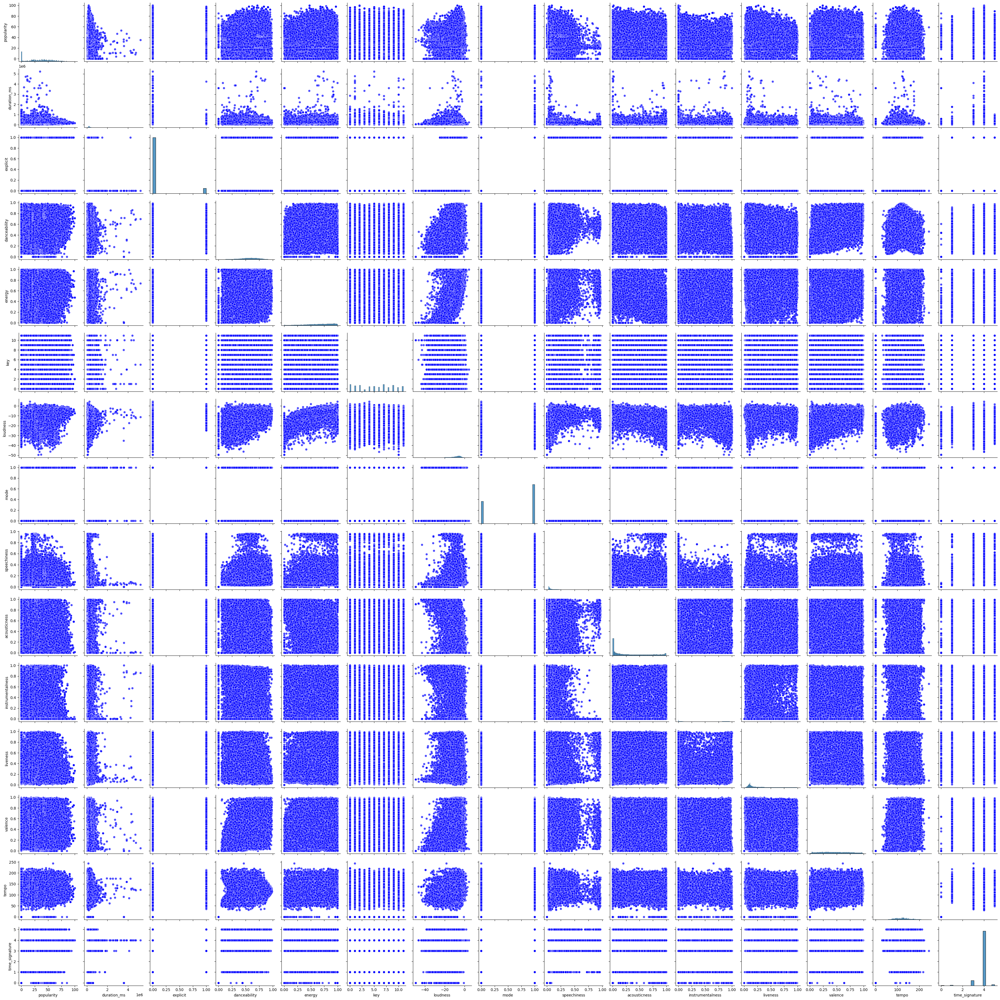

In [29]:
import seaborn as sns

import matplotlib.pyplot as plt

# Create a pairplot with histograms on the diagonal
sns.pairplot(df, plot_kws={'alpha':0.7, 'color':'blue'})

# Show the plot
plt.show()


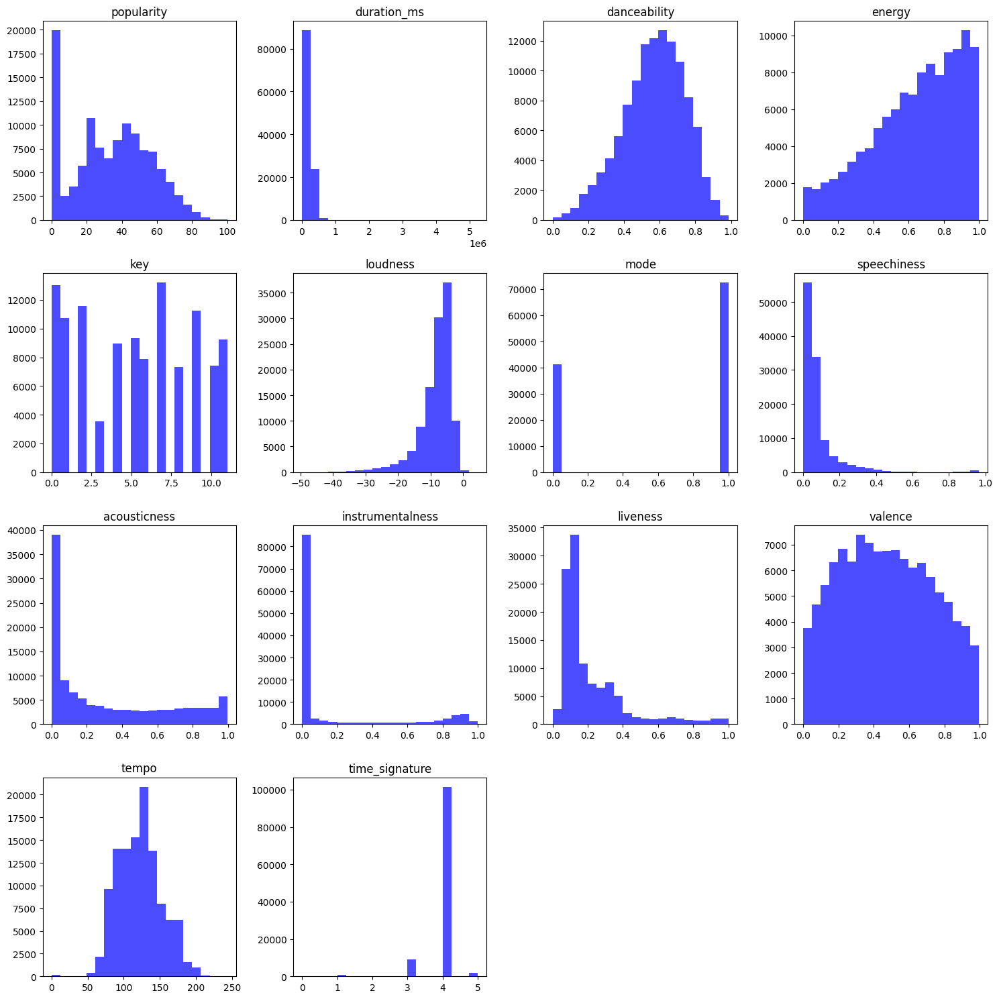

In [36]:
# Select numerical columns
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
# Create a grid of histograms
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))  # Adjust rows and columns for your data
axes = axes.flatten()  # Flatten axes for easy iteration

for i, col in enumerate(numerical_cols):
    if i < len(axes):  # Plot only if there's a corresponding axis
        axes[i].hist(df[col].dropna(), bins=20, color='blue', alpha=0.7)  # Plot histogram
        axes[i].set_title(col)  # Set title as column name

# Remove empty subplots
for i in range(len(numerical_cols), len(axes)):
    fig.delaxes(axes[i])

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

#### Numerical features

In [44]:
numerical = [f for f in df.columns if df.dtypes[f] != 'object']
print(numerical)
numerical_but_continuous = [f for f in numerical if len(df[f].unique()) > 20]
print(really_numerical)
numerical_but_discrete = list(set(numerical) - set(numerical_but_continuous))
print(numerical_but_discrete)

['popularity', 'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']
['popularity', 'duration_ms', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
['time_signature', 'mode', 'explicit', 'key']


##### Discrete

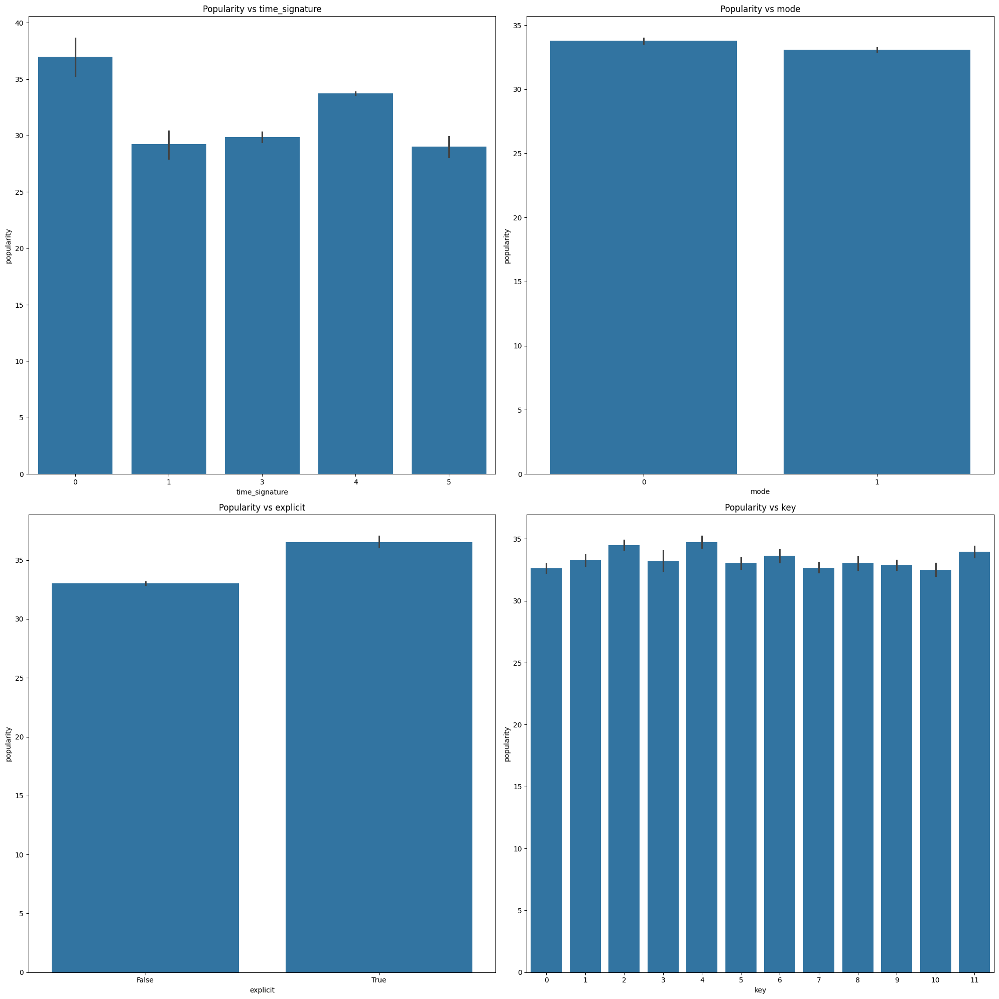

In [47]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
axes = axes.flatten()

for i, f in enumerate(numerical_but_discrete):
    sns.barplot(x=f, y='popularity', data=df, ax=axes[i])
    axes[i].set_title(f'Popularity vs {f}')

# Remove any unused subplots
for j in range(len(numerical_but_discrete), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Songs with explicity lyrics seem to be more popular than non-explicit ones.

Time signautre 0 and 4 seem to make a song more popular.

`--> time_signature: An estimated time signature. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure). The time signature ranges from 3 to 7 indicating time signatures of 3/4, to 7/4.`

Other two features seem to be more or less the same for all of their values.

##### Continuous

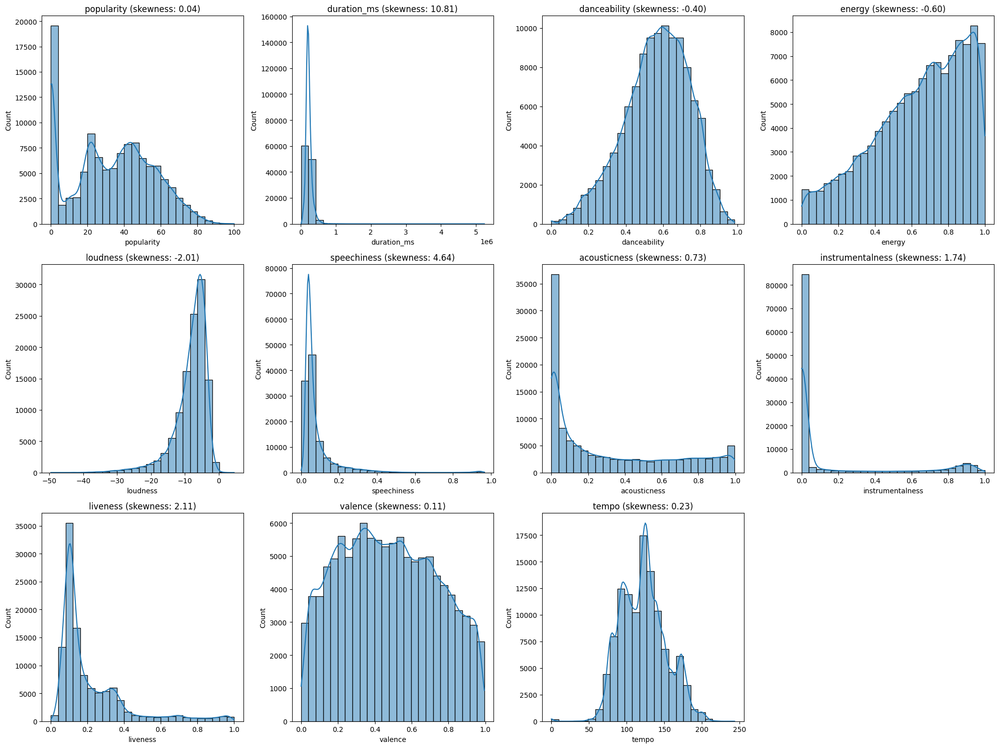

In [51]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))
axes = axes.flatten()

for i, f in enumerate(numerical_but_continuous):
    if i < len(axes):
        sns.histplot(x=f, data=df, bins=25, kde=True, ax=axes[i])
        axes[i].set_title(f'{f} (skewness: {skew(df[f]):.2f})')

# Remove any unused subplots
for j in range(len(numerical_but_continuous), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

#### Categorical features

## Dimensionality reduction

### SVD

In [50]:
print(df_numeric.isnull().sum())

popularity             0
duration_ms            0
danceability           0
energy                 0
key                    0
loudness               0
mode                   0
speechiness            0
acousticness           0
instrumentalness       0
liveness               0
valence                0
tempo                  0
time_signature         0
popularity_category    2
dtype: int64


In [63]:
df_numeric2 = df_numeric.drop(columns=['popularity', 'popularity_category'])

In [64]:
print("\nData types of each column:")
for col in df_numeric2.columns:
    print(f'{col}: {df_numeric2[col].dtype}')


Data types of each column:
duration_ms: float64
danceability: float64
energy: float64
key: int64
loudness: float64
mode: int64
speechiness: float64
acousticness: float64
instrumentalness: float64
liveness: float64
valence: float64
tempo: float64
time_signature: int64


In [71]:

svd = TruncatedSVD(n_components=8)
sklearn_svd = svd.fit_transform(df_numeric2)

In [72]:
explained_variance_ratio = svd.explained_variance_ratio_
print("\nExplained variance ratio:", explained_variance_ratio)
print(f"Total variance explained: {sum(explained_variance_ratio)*100:.2f}%")


Explained variance ratio: [0.41577245 0.1405088  0.13197666 0.06555022 0.04668673 0.04196706
 0.03845351 0.03512369]
Total variance explained: 91.60%


8 components explains more than 90% of the variance.

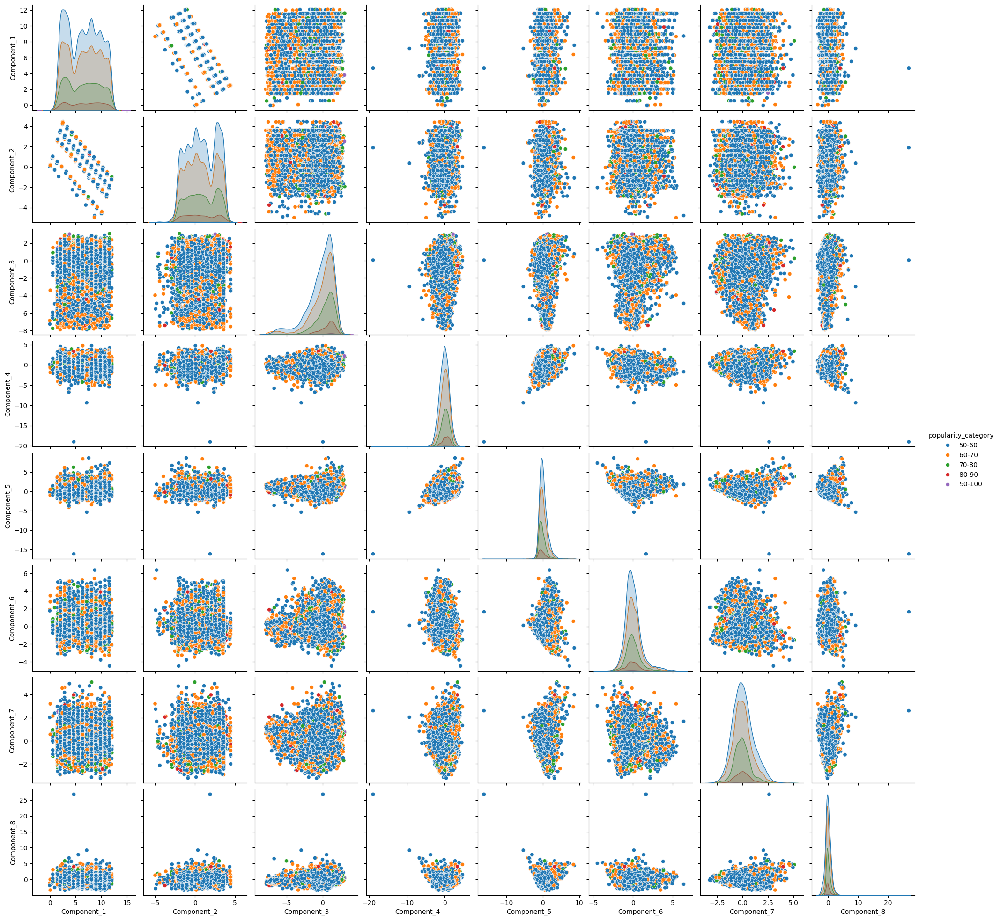

In [73]:
# Create a DataFrame with the reduced dimensions
reduced_df = pd.DataFrame(sklearn_svd, columns=[f'Component_{i+1}' for i in range(sklearn_svd.shape[1])])

# Add the popularity category to the reduced_df for coloring in the pairplot
reduced_df['popularity_category'] = df_numeric['popularity_category'].values

# Plot the pairplot
sns.pairplot(reduced_df, hue='popularity_category')
plt.show()

## Unsupervised learning

In [ ]:
# For the data clustering, we can only have numerical values, 
# so we will remove the "Class" variable.